## Covid-19 EDA Datathon USA Covid-19
### Jorge Vázquez

Existe una API pública y gratuita que guardó y registro de datos sobre el Covid19 enEstados Unidos hasta 2021.

Es la siguiente: https://covidtracking.com/data/api

El reto es de análisis de datos. El objetivo es cargar usando Python desde la API los datos relativos a la incidencia de Covid19 históricos por estado.

Una vez cargados, hacer una exploración de esos datos y elaborar un informe con las conclusiones y los descubrimientos.
Contadnos la historia que habéis leído en los datos.


Nota: Para este proyecto he seguido una "metodología" de IA Pair Programming utilizando la versión gratuita de ChatGPT.

#### 1. Cargar los datos por estado utilizando la API provista por el sitio web covidtracking.com

Dado que el requerimiento es cargar los datos históricos, opté por enfocarme en los datos de la API V2 de la sección "Historic data for a state or territory" que se encuentran en el endpoint https://api.covidtracking.com/v2/states/{state}/daily/simple.json

Estados Unidos utiliza comunmente una abreviatura de 2 caracteres en mayúsculas para sus estados y territorios.

IA Pair Programming. Este es el prompt inicial que utilicé para la extracción (no incluyo las iteraciones necesarias para completar el proceso):

Hi. I need to extract historic data by state from the website mentioned between triple dashes below. I need to perform the extraction using the available API. Do not worry about the data not being updated anymore. Focus on all the historic data available. For this task, I need to use Python within a Jupyter Notebook. Do the following steps before proposing a Python code solution for this: 1. Analyze the website and find the right endpoint to extract data by state. 2. Write code to extract the data to a pandas dataframe. 3. Review you solution to doublecheck for possible errors. ---https://covidtracking.com/data/api---



In [37]:
import requests
import pandas as pd

#I add here the graphic libraries to be used later
import matplotlib.pyplot as plt
import seaborn as sns

# List of all U.S. state abbreviations
states = [
    'AL', 'AK', 'AZ', 'AR', 'CA', 'CO', 'CT', 'DE', 'FL', 'GA', 'HI', 'ID', 'IL', 'IN',
    'IA', 'KS', 'KY', 'LA', 'ME', 'MD', 'MA', 'MI', 'MN', 'MS', 'MO', 'MT', 'NE', 'NV',
    'NH', 'NJ', 'NM', 'NY', 'NC', 'ND', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN',
    'TX', 'UT', 'VT', 'VA', 'WA', 'WV', 'WI', 'WY'
]

# Mapping state abbreviations to full names
state_name_mapping = {
    'AL': 'Alabama', 'AK': 'Alaska', 'AZ': 'Arizona', 'AR': 'Arkansas',
    'CA': 'California', 'CO': 'Colorado', 'CT': 'Connecticut', 'DE': 'Delaware',
    'FL': 'Florida', 'GA': 'Georgia', 'HI': 'Hawaii', 'ID': 'Idaho',
    'IL': 'Illinois', 'IN': 'Indiana', 'IA': 'Iowa', 'KS': 'Kansas',
    'KY': 'Kentucky', 'LA': 'Louisiana', 'ME': 'Maine', 'MD': 'Maryland',
    'MA': 'Massachusetts', 'MI': 'Michigan', 'MN': 'Minnesota', 'MS': 'Mississippi',
    'MO': 'Missouri', 'MT': 'Montana', 'NE': 'Nebraska', 'NV': 'Nevada',
    'NH': 'New Hampshire', 'NJ': 'New Jersey', 'NM': 'New Mexico', 'NY': 'New York',
    'NC': 'North Carolina', 'ND': 'North Dakota', 'OH': 'Ohio', 'OK': 'Oklahoma',
    'OR': 'Oregon', 'PA': 'Pennsylvania', 'RI': 'Rhode Island', 'SC': 'South Carolina',
    'SD': 'South Dakota', 'TN': 'Tennessee', 'TX': 'Texas', 'UT': 'Utah',
    'VT': 'Vermont', 'VA': 'Virginia', 'WA': 'Washington', 'WV': 'West Virginia',
    'WI': 'Wisconsin', 'WY': 'Wyoming', 'DC': 'District of Columbia',
    'AS': 'American Samoa', 'GU': 'Guam', 'MP': 'Northern Mariana Islands',
    'PR': 'Puerto Rico', 'VI': 'Virgin Islands'
}

# Grouping states and territories into 5 buckets
state_group_mapping = {
    'AL': 'South', 'AK': 'West', 'AZ': 'West', 'AR': 'South',
    'CA': 'West', 'CO': 'West', 'CT': 'Northeast', 'DE': 'South',
    'FL': 'South', 'GA': 'South', 'HI': 'West', 'ID': 'West',
    'IL': 'Midwest', 'IN': 'Midwest', 'IA': 'Midwest', 'KS': 'Midwest',
    'KY': 'South', 'LA': 'South', 'ME': 'Northeast', 'MD': 'South',
    'MA': 'Northeast', 'MI': 'Midwest', 'MN': 'Midwest', 'MS': 'South',
    'MO': 'Midwest', 'MT': 'West', 'NE': 'Midwest', 'NV': 'West',
    'NH': 'Northeast', 'NJ': 'Northeast', 'NM': 'West', 'NY': 'Northeast',
    'NC': 'South', 'ND': 'Midwest', 'OH': 'Midwest', 'OK': 'South',
    'OR': 'West', 'PA': 'Northeast', 'RI': 'Northeast', 'SC': 'South',
    'SD': 'Midwest', 'TN': 'South', 'TX': 'South', 'UT': 'West',
    'VT': 'Northeast', 'VA': 'South', 'WA': 'West', 'WV': 'South',
    'WI': 'Midwest', 'WY': 'West', 'DC': 'South',
    'AS': 'Territories', 'GU': 'Territories', 'MP': 'Territories',
    'PR': 'Territories', 'VI': 'Territories'
}

# Function to fetch data for a single state
def fetch_state_data(state):
    url = f"https://api.covidtracking.com/v2/states/{state}/daily/simple.json"
    try:
        response = requests.get(url)
        response.raise_for_status()
        data = response.json()
        
        # Extract the 'data' field which contains the relevant information
        if 'data' in data:
            return pd.json_normalize(data['data'])  # Flatten nested data
        else:
            print(f"No data found for state {state}")
            return pd.DataFrame()
        
    except requests.exceptions.RequestException as e:
        print(f"Failed to fetch data for state {state}: {e}")
        return pd.DataFrame()  # Return an empty DataFrame on error


# List comprehension to fetch data and filter out empty or all-NA DataFrames
fetched_data = [fetch_state_data(state.lower()) for state in states]

# Filter out empty or all-NA DataFrames
filtered_data = [df for df in fetched_data if not df.empty and not df.isna().all().all()]

# Concatenate the filtered DataFrames into a single one
all_states_data = pd.concat(filtered_data, ignore_index=True)

# Adding columns to the DataFrame
all_states_data['state_name'] = all_states_data['state'].map(state_name_mapping)
all_states_data['region'] = all_states_data['state'].map(state_group_mapping)


# Save the data to a CSV file for future use
all_states_data.to_csv('covid_tracking_all_states.csv', index=False) #Comentado una vez que se obtuvo el fichero

# Display the first few rows of the combined DataFrame
all_states_data.head()


C:\Users\jvazq\AppData\Local\Temp\ipykernel_21180\61972129.py:81: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  all_states_data = pd.concat(filtered_data, ignore_index=True)


,date,state,meta.data_quality_grade,meta.updated,meta.tests.total_source,cases.total,cases.confirmed,cases.probable,tests.pcr.total,tests.pcr.pending,...,outcomes.hospitalized.currently,outcomes.hospitalized.in_icu.total,outcomes.hospitalized.in_icu.currently,outcomes.hospitalized.on_ventilator.total,outcomes.hospitalized.on_ventilator.currently,outcomes.death.total,outcomes.death.confirmed,outcomes.death.probable,state_name,region
0,2021-03-07,AL,A,2021-03-07T16:00:00Z,totalTestsPeopleViral,499819.0,392077.0,107742.0,2323788.0,NaN,...,494.0,2676.0,NaN,1515.0,NaN,10148.0,7963.0,2185.0,Alabama,South
1,2021-03-06,AL,A,2021-03-06T16:00:00Z,totalTestsPeopleViral,499411.0,391817.0,107594.0,2321441.0,NaN,...,526.0,2675.0,NaN,1514.0,NaN,10149.0,7963.0,2186.0,Alabama,South
2,2021-03-05,AL,A,2021-03-05T16:00:00Z,totalTestsPeopleViral,498887.0,391369.0,107518.0,2316127.0,NaN,...,526.0,2672.0,NaN,1514.0,NaN,10122.0,7943.0,2179.0,Alabama,South
3,2021-03-04,AL,A,2021-03-04T16:00:00Z,totalTestsPeopleViral,498076.0,390672.0,107404.0,2311207.0,NaN,...,544.0,2666.0,NaN,1513.0,NaN,10094.0,7920.0,2174.0,Alabama,South
4,2021-03-03,AL,A,2021-03-03T16:00:00Z,totalTestsPeopleViral,497154.0,389772.0,107382.0,2305317.0,NaN,...,559.0,2662.0,NaN,1510.0,NaN,10029.0,7872.0,2157.0,Alabama,South


#### 2. Exploración Inicial

Se han juntado todos los estados en un dataframe llamado all_states_data. Se observan muchos vacíos y muchos nulos así como muchos campos que no parecen contribuir a una historia-summary de un hecho histórico como la epidemia mundial Covid-19. Se hará un limpiado de datos en un segundo dataframe y a partir de allí se construirá la historia. 

In [39]:
print(all_states_data.shape)

(18627, 41)


In [40]:
print(all_states_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18627 entries, 0 to 18626
Data columns (total 41 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   date                                           18627 non-null  object 
 1   state                                          18627 non-null  object 
 2   meta.data_quality_grade                        17499 non-null  object 
 3   meta.updated                                   18018 non-null  object 
 4   meta.tests.total_source                        18627 non-null  object 
 5   cases.total                                    18454 non-null  float64
 6   cases.confirmed                                12891 non-null  float64
 7   cases.probable                                 8825 non-null   float64
 8   tests.pcr.total                                18461 non-null  float64
 9   tests.pcr.pending                              167

In [41]:
# Display the first few rows of the dataset
print(all_states_data.head())

         date state meta.data_quality_grade          meta.updated  \
0  2021-03-07    AL                       A  2021-03-07T16:00:00Z   
1  2021-03-06    AL                       A  2021-03-06T16:00:00Z   
2  2021-03-05    AL                       A  2021-03-05T16:00:00Z   
3  2021-03-04    AL                       A  2021-03-04T16:00:00Z   
4  2021-03-03    AL                       A  2021-03-03T16:00:00Z   

  meta.tests.total_source  cases.total  cases.confirmed  cases.probable  \
0   totalTestsPeopleViral     499819.0         392077.0        107742.0   
1   totalTestsPeopleViral     499411.0         391817.0        107594.0   
2   totalTestsPeopleViral     498887.0         391369.0        107518.0   
3   totalTestsPeopleViral     498076.0         390672.0        107404.0   
4   totalTestsPeopleViral     497154.0         389772.0        107382.0   

   tests.pcr.total  tests.pcr.pending  ...  outcomes.hospitalized.currently  \
0        2323788.0                NaN  ...             

In [42]:
# Get summary statistics for numerical columns
print(all_states_data.describe())


        cases.total  cases.confirmed  cases.probable  tests.pcr.total  \
count  1.845400e+04     1.289100e+04     8825.000000     1.846100e+04   
mean   1.832619e+05     1.965148e+05    22761.739037     2.427172e+06   
std    3.405308e+05     3.474007e+05    46364.850332     4.628071e+06   
min    0.000000e+00     0.000000e+00        0.000000     0.000000e+00   
25%    1.002100e+04     1.894200e+04      997.000000     1.882310e+05   
50%    6.091750e+04     8.431100e+04     4882.000000     8.461610e+05   
75%    2.043298e+05     2.290610e+05    21184.000000     2.600443e+06   
max    3.501394e+06     3.501394e+06   365961.000000     4.964601e+07   

       tests.pcr.pending  tests.pcr.encounters.total  \
count        1675.000000                4.863000e+03   
mean         2079.185075                2.874782e+06   
std          5196.405052                5.217694e+06   
min             0.000000                0.000000e+00   
25%           118.000000                2.195835e+05   
50%   

In [43]:
# Check for missing values
missing_values = all_states_data.isnull().sum()
print(missing_values)


date                                                 0
state                                                0
meta.data_quality_grade                           1128
meta.updated                                       609
meta.tests.total_source                              0
cases.total                                        173
cases.confirmed                                   5736
cases.probable                                    9802
tests.pcr.total                                    166
tests.pcr.pending                                16952
tests.pcr.encounters.total                       13764
tests.pcr.specimens.total                         5358
tests.pcr.specimens.positive                      9960
tests.pcr.specimens.negative                     13894
tests.pcr.people.total                           10260
tests.pcr.people.positive                          173
tests.pcr.people.negative                         7081
tests.antibody.encounters.total                  14123
tests.anti

In [44]:
# Get the list of unique states in the dataset
unique_states = all_states_data['state'].unique()
print(f"Unique states: {unique_states}")

# Get the range of dates in the dataset
date_range = pd.to_datetime(all_states_data['date']).agg(['min', 'max'])
print(f"Date range: {date_range}")


Unique states: ['AL' 'AK' 'AZ' 'AR' 'CA' 'CO' 'CT' 'DE' 'FL' 'GA' 'HI' 'ID' 'IL' 'IN'
 'IA' 'KS' 'KY' 'LA' 'ME' 'MD' 'MA' 'MI' 'MN' 'MS' 'MO' 'MT' 'NE' 'NV'
 'NH' 'NJ' 'NM' 'NY' 'NC' 'ND' 'OH' 'OK' 'OR' 'PA' 'RI' 'SC' 'SD' 'TN'
 'TX' 'UT' 'VT' 'VA' 'WA' 'WV' 'WI' 'WY']
Date range: min   2020-01-13
max   2021-03-07
Name: date, dtype: datetime64[ns]


In [45]:
print(all_states_data.nunique())

date                                               420
state                                               50
meta.data_quality_grade                              7
meta.updated                                      8714
meta.tests.total_source                              4
cases.total                                      16048
cases.confirmed                                  11812
cases.probable                                    6255
tests.pcr.total                                  17297
tests.pcr.pending                                  905
tests.pcr.encounters.total                        4700
tests.pcr.specimens.total                        12257
tests.pcr.specimens.positive                      7846
tests.pcr.specimens.negative                      4357
tests.pcr.people.total                            7836
tests.pcr.people.positive                        16048
tests.pcr.people.negative                        10263
tests.antibody.encounters.total                   3494
tests.anti

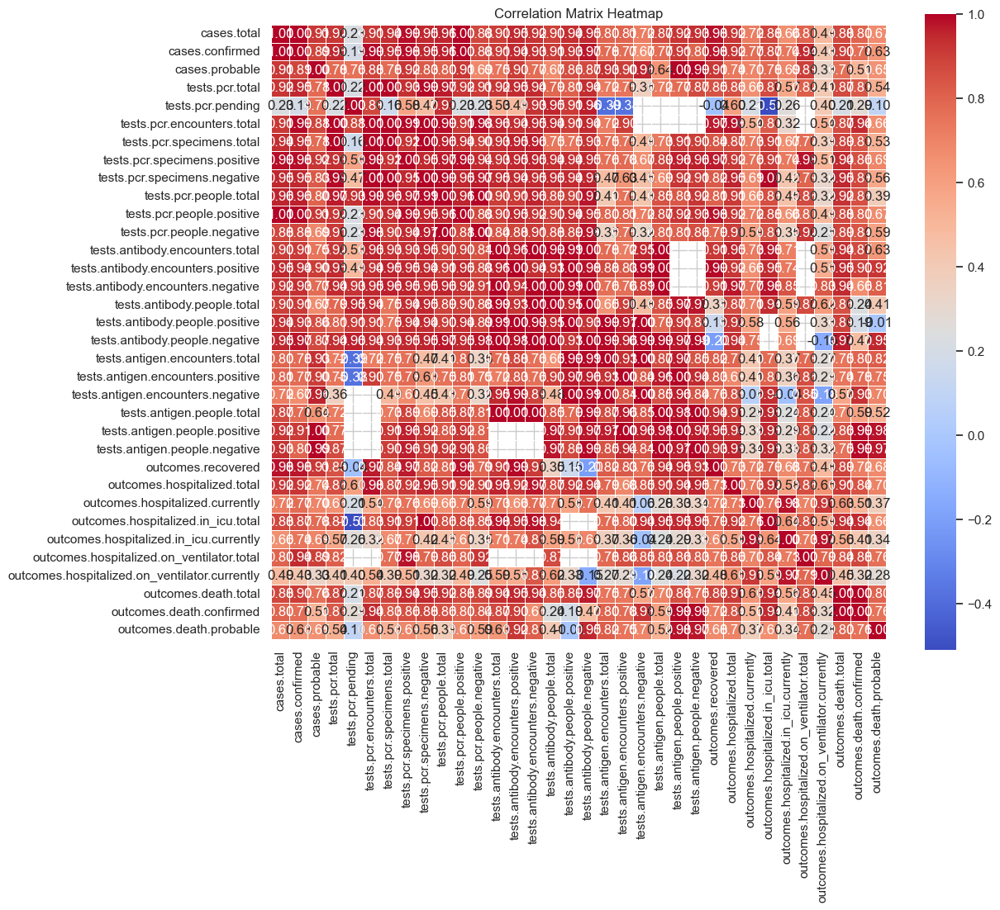

In [46]:
# Compute the correlation matrix for numerical columns
#correlation_matrix = all_states_data.corr()
#print(correlation_matrix)

# Exclude non-numeric columns from the DataFrame
numeric_data = all_states_data.select_dtypes(include=['number'])

# Compute the correlation matrix for numerical columns
correlation_matrix = numeric_data.corr()

# Set the size of the figure
plt.figure(figsize=(12, 10))

# Create a heatmap of the correlation matrix
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, linewidths=.5)

# Add a title
plt.title('Correlation Matrix Heatmap')

# Display the heatmap
plt.show()


In [47]:

# Assuming all_states_data is already loaded, let's start with getting the column data types
print(all_states_data.dtypes)

# Categorical columns are usually of type 'object' or have a limited number of unique values
categorical_columns = []
non_categorical_columns = []

for column in all_states_data.columns:
    if all_states_data[column].dtype == 'object' or all_states_data[column].nunique() < 0.05 * len(all_states_data):
        categorical_columns.append(column)
    else:
        non_categorical_columns.append(column)

print(f"Categorical columns: {categorical_columns}")
print(f"Non-categorical columns: {non_categorical_columns}")


date                                              object
state                                             object
meta.data_quality_grade                           object
meta.updated                                      object
meta.tests.total_source                           object
cases.total                                      float64
cases.confirmed                                  float64
cases.probable                                   float64
tests.pcr.total                                  float64
tests.pcr.pending                                float64
tests.pcr.encounters.total                       float64
tests.pcr.specimens.total                        float64
tests.pcr.specimens.positive                     float64
tests.pcr.specimens.negative                     float64
tests.pcr.people.total                           float64
tests.pcr.people.positive                        float64
tests.pcr.people.negative                        float64
tests.antibody.encounters.total

### 3. Analisis gráfico de datos utilizando matplotlib y seaborn

IA Pair Programming prompt:
My dataframe currently has the same structure as the sample csv below between triple backticks. The data is the historical data of Covid-19 pandemic in US states and territories. No new data will exist. Please do the following tasks but ensure you perform them in order and finish one before starting the next. 1. Analyze the sample csv. 2. Suggest meaningful insights and common insights extracted for this data in the media. 3. Generate python code to present this insights using matplotlib and seaborn. 4. generate python code to present this insights using bokeh. 
date,state,meta.data_quality_grade,meta.updated,meta.tests.total_source,cases.total,cases.confirmed,cases.probable,tests.pcr.total,tests.pcr.pending,tests.pcr.encounters.total,tests.pcr.specimens.total,tests.pcr.specimens.positive,tests.pcr.specimens.negative,tests.pcr.people.total,tests.pcr.people.positive,tests.pcr.people.negative,tests.antibody.encounters.total,tests.antibody.encounters.positive,tests.antibody.encounters.negative,tests.antibody.people.total,tests.antibody.people.positive,tests.antibody.people.negative,tests.antigen.encounters.total,tests.antigen.encounters.positive,tests.antigen.encounters.negative,tests.antigen.people.total,tests.antigen.people.positive,tests.antigen.people.negative,outcomes.recovered,outcomes.hospitalized.total,outcomes.hospitalized.currently,outcomes.hospitalized.in_icu.total,outcomes.hospitalized.in_icu.currently,outcomes.hospitalized.on_ventilator.total,outcomes.hospitalized.on_ventilator.currently,outcomes.death.total,outcomes.death.confirmed,outcomes.death.probable,state_name,region
2021-03-07,AL,A,2021-03-07T16:00:00Z,totalTestsPeopleViral,499819.0,392077.0,107742.0,2323788.0,,,,,,2323788.0,499819.0,1931711.0,,,,119757.0,,,,,,,,,295690.0,45976.0,494.0,2676.0,,1515.0,,10148.0,7963.0,2185.0,Alabama,South
2021-03-06,AL,A,2021-03-06T16:00:00Z,totalTestsPeopleViral,499

# Mathplotlib y Seaborn

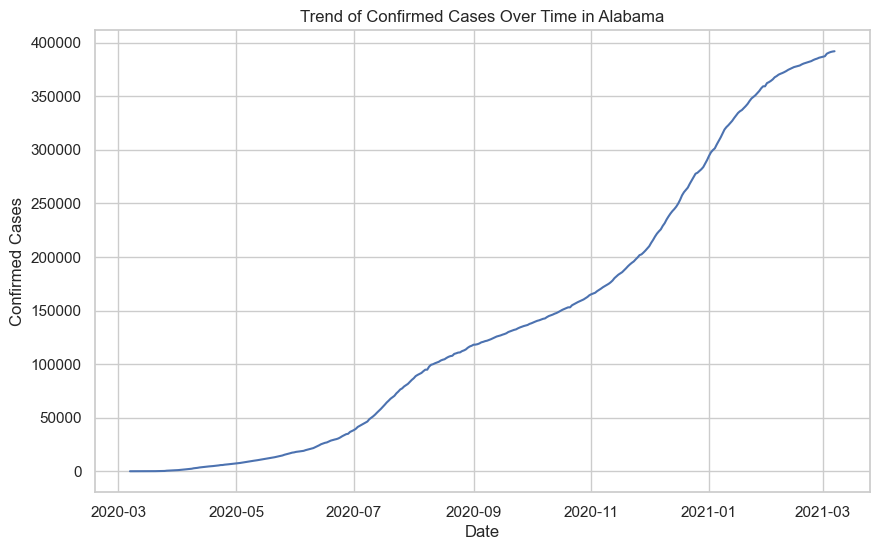

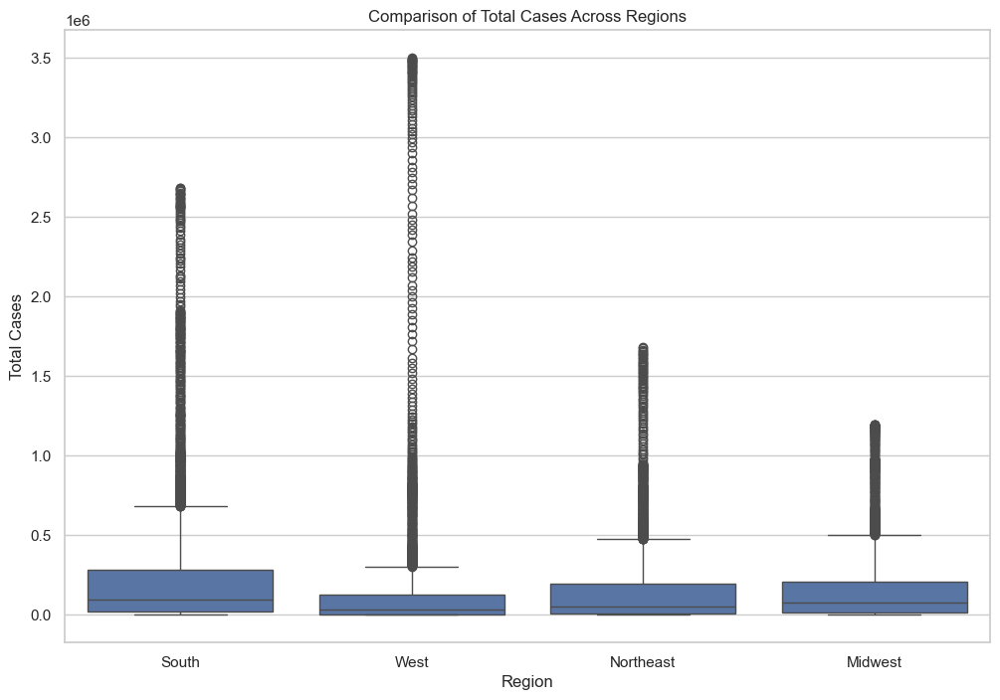

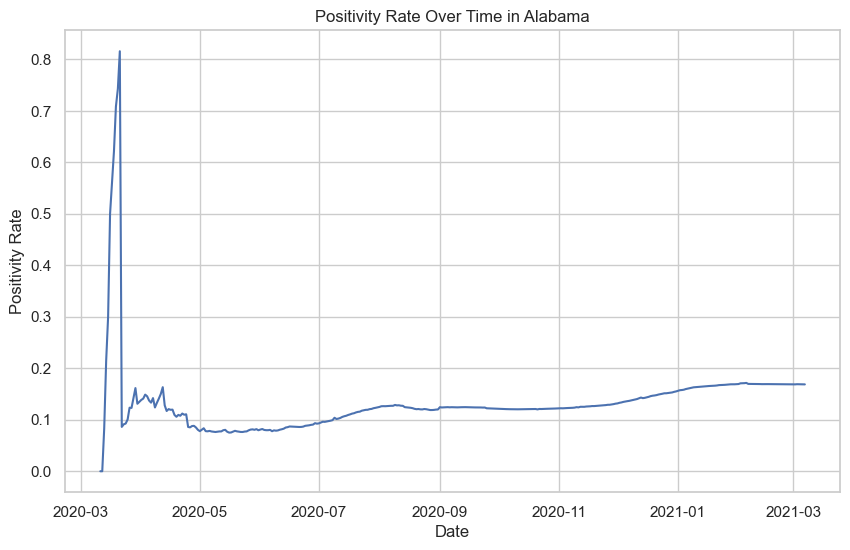

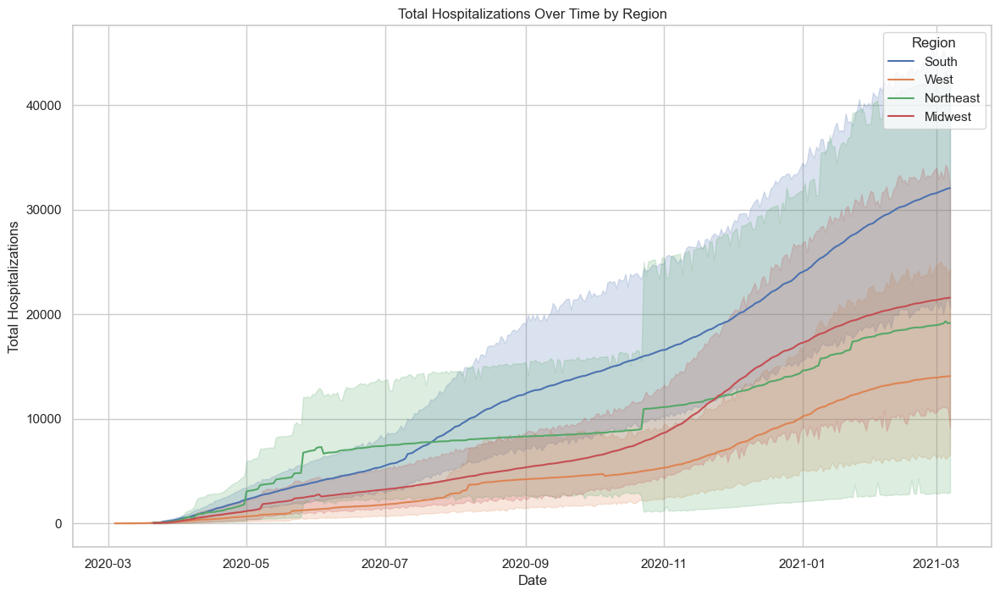

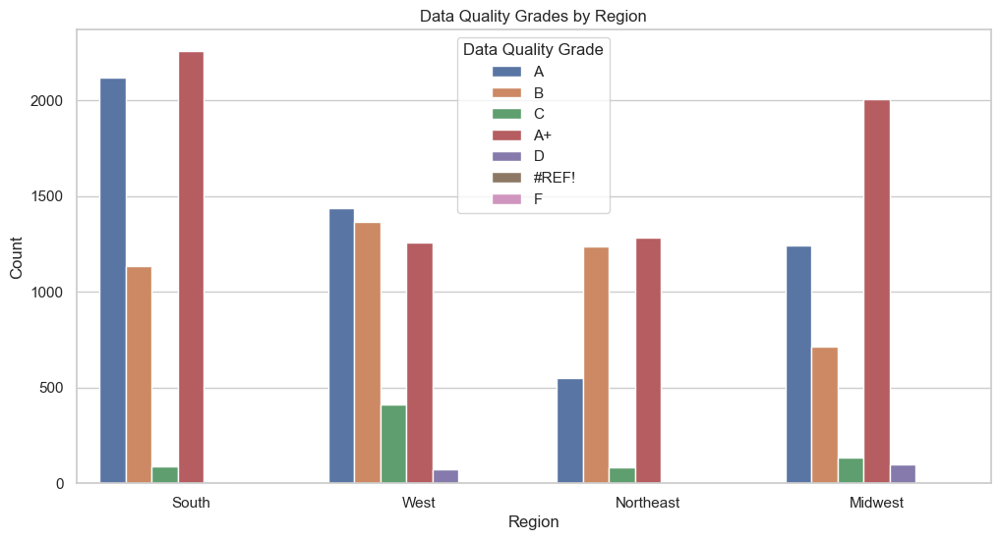

In [49]:
#import pandas as pd
#import matplotlib.pyplot as plt
#import seaborn as sns

# Assuming 'all_states_data' is your DataFrame
# Convert date to datetime format
all_states_data['date'] = pd.to_datetime(all_states_data['date'])

# 1. Trend of Confirmed Cases Over Time for a Specific State (e.g., Alabama)
plt.figure(figsize=(10, 6))
sns.lineplot(data=all_states_data[all_states_data['state_name'] == 'Alabama'], x='date', y='cases.confirmed')
plt.title('Trend of Confirmed Cases Over Time in Alabama')
plt.xlabel('Date')
plt.ylabel('Confirmed Cases')
plt.show()

# 2. Regional Comparison of Total Cases
plt.figure(figsize=(12, 8))
sns.boxplot(data=all_states_data, x='region', y='cases.total')
plt.title('Comparison of Total Cases Across Regions')
plt.xlabel('Region')
plt.ylabel('Total Cases')
plt.show()

# 3. Positivity Rate Over Time for a Specific State (e.g., Alabama)
all_states_data['positivity_rate'] = all_states_data['cases.confirmed'] / all_states_data['tests.pcr.total']

plt.figure(figsize=(10, 6))
sns.lineplot(data=all_states_data[all_states_data['state_name'] == 'Alabama'], x='date', y='positivity_rate')
plt.title('Positivity Rate Over Time in Alabama')
plt.xlabel('Date')
plt.ylabel('Positivity Rate')
plt.show()

# 4. Hospitalizations Over Time by Region
plt.figure(figsize=(14, 8))
sns.lineplot(data=all_states_data, x='date', y='outcomes.hospitalized.total', hue='region')
plt.title('Total Hospitalizations Over Time by Region')
plt.xlabel('Date')
plt.ylabel('Total Hospitalizations')
plt.legend(title='Region')
plt.show()

# 5. Data Quality Grades by Region
plt.figure(figsize=(12, 6))
sns.countplot(data=all_states_data, x='region', hue='meta.data_quality_grade')
plt.title('Data Quality Grades by Region')
plt.xlabel('Region')
plt.ylabel('Count')
plt.legend(title='Data Quality Grade')
plt.show()


# Bokeh

In [51]:
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.layouts import row
from bokeh.palettes import Category20

output_notebook()

# Convert to ColumnDataSource for Bokeh
source = ColumnDataSource(all_states_data[all_states_data['state_name'] == 'Alabama'])

# 1. Confirmed Cases Over Time
p1 = figure(title="Confirmed Cases Over Time in Alabama", x_axis_type='datetime', height=400, width=700)
p1.line('date', 'cases.confirmed', source=source, line_width=2, color='navy', legend_label="Confirmed Cases")
p1.xaxis.axis_label = 'Date'
p1.yaxis.axis_label = 'Confirmed Cases'
p1.add_tools(HoverTool(tooltips=[("Date", "@date{%F}"), ("Confirmed Cases", "@cases.confirmed")], formatters={'@date': 'datetime'}))

# 2. Positivity Rate Over Time
source.add(all_states_data[all_states_data['state_name'] == 'Alabama']['positivity_rate'], 'positivity_rate')
p2 = figure(title="Positivity Rate Over Time in Alabama", x_axis_type='datetime', height=400, width=700)
p2.line('date', 'positivity_rate', source=source, line_width=2, color='green', legend_label="Positivity Rate")
p2.xaxis.axis_label = 'Date'
p2.yaxis.axis_label = 'Positivity Rate'
p2.add_tools(HoverTool(tooltips=[("Date", "@date{%F}"), ("Positivity Rate", "@positivity_rate")], formatters={'@date': 'datetime'}))

show(row(p1, p2))

# 3. Regional Comparison of Total Cases (Boxplot Equivalent)
from bokeh.transform import jitter
from bokeh.models import FactorRange

regions = list(all_states_data['region'].unique())
p3 = figure(x_range=FactorRange(*regions), height=400, width=700, title="Comparison of Total Cases Across Regions")
p3.circle(jitter('region', width=0.4, range=p3.x_range), 'cases.total', source=all_states_data, alpha=0.3, color='blue')

p3.xaxis.axis_label = 'Region'
p3.yaxis.axis_label = 'Total Cases'
show(p3)

# 4. Hospitalizations Over Time by Region
p4 = figure(title="Total Hospitalizations Over Time by Region", x_axis_type='datetime', height=400, width=700)
for i, region in enumerate(regions):
    region_data = all_states_data[all_states_data['region'] == region]
    p4.line(region_data['date'], region_data['outcomes.hospitalized.total'], color=Category20[len(regions)][i], legend_label=region)

p4.xaxis.axis_label = 'Date'
p4.yaxis.axis_label = 'Total Hospitalizations'
show(p4)


Loading BokehJS ...

### De aquí para abajo en pausa

In [48]:


# Set the style for seaborn
sns.set_theme(style="whitegrid")


C:\Users\jvazq\AppData\Local\Temp\ipykernel_21180\1542344802.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  state_data['date'] = pd.to_datetime(state_data['date'])


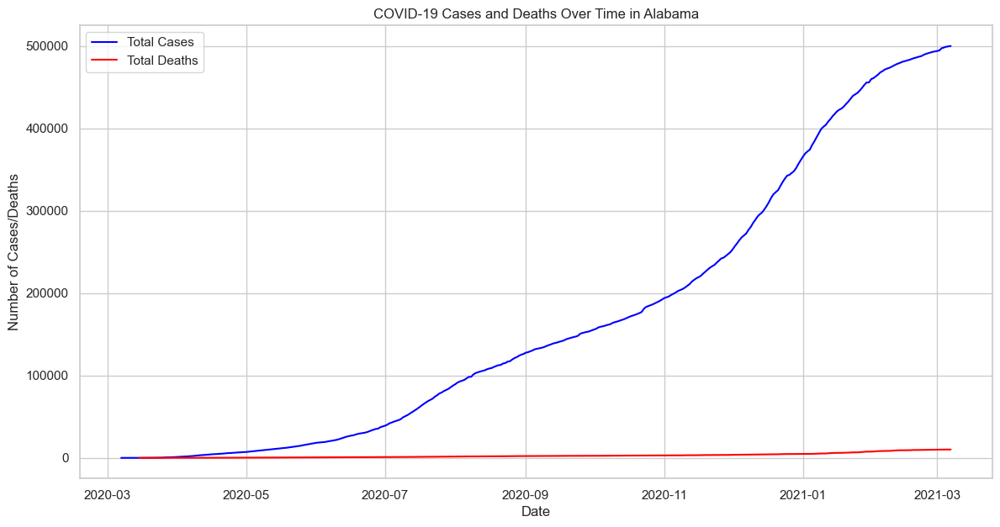

In [24]:
# Filter data for a specific state, e.g., Alabama
state_data = all_states_data[all_states_data['state'] == 'AL']

# Convert the date column to datetime
state_data['date'] = pd.to_datetime(state_data['date'])

# Plot the total number of cases over time
plt.figure(figsize=(14, 7))
plt.plot(state_data['date'], state_data['cases.total'], label='Total Cases', color='blue')
plt.plot(state_data['date'], state_data['outcomes.death.total'], label='Total Deaths', color='red')
plt.xlabel('Date')
plt.ylabel('Number of Cases/Deaths')
plt.title('COVID-19 Cases and Deaths Over Time in Alabama')
plt.legend()
plt.show()


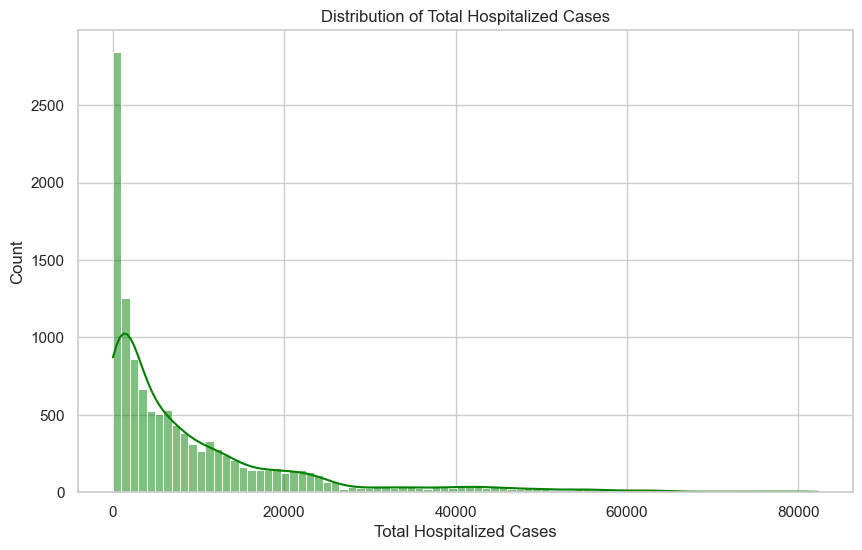

In [25]:
# Plot the distribution of hospitalized cases
plt.figure(figsize=(10, 6))
sns.histplot(all_states_data['outcomes.hospitalized.total'].dropna(), kde=True, color='green')
plt.xlabel('Total Hospitalized Cases')
plt.title('Distribution of Total Hospitalized Cases')
plt.show()


In [26]:
# Plot a heatmap of the correlation matrix
plt.figure(figsize=(14, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of COVID-19 Data')
plt.show()


NameError: name 'correlation_matrix' is not defined

<Figure size 1400x1000 with 0 Axes>

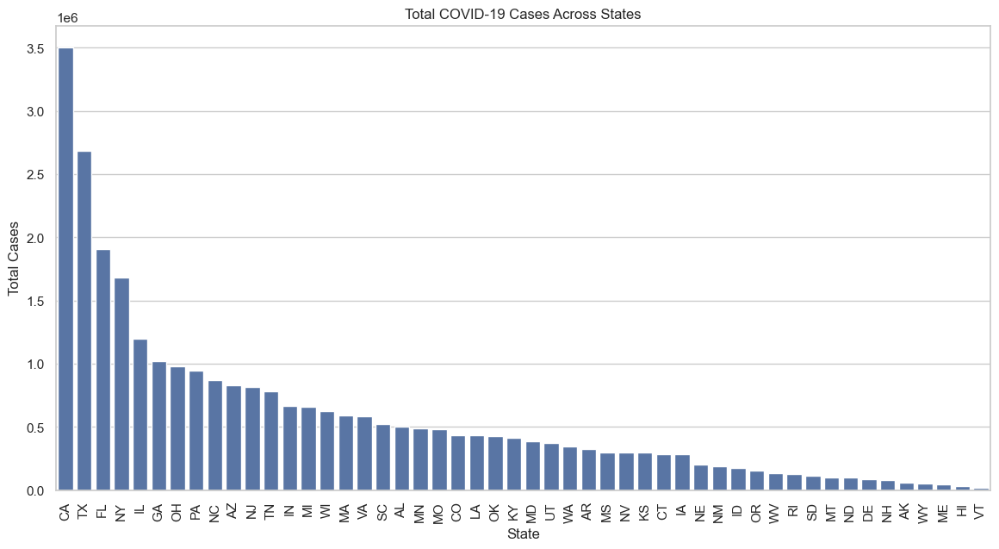

In [27]:
# Group data by state and sum the total cases
state_cases = all_states_data.groupby('state')['cases.total'].max().reset_index()

# Plot the total number of cases across states
plt.figure(figsize=(14, 7))
sns.barplot(x='state', y='cases.total', data=state_cases.sort_values('cases.total', ascending=False))
plt.xlabel('State')
plt.ylabel('Total Cases')
plt.title('Total COVID-19 Cases Across States')
plt.xticks(rotation=90)
plt.show()


### Analisis categoricas

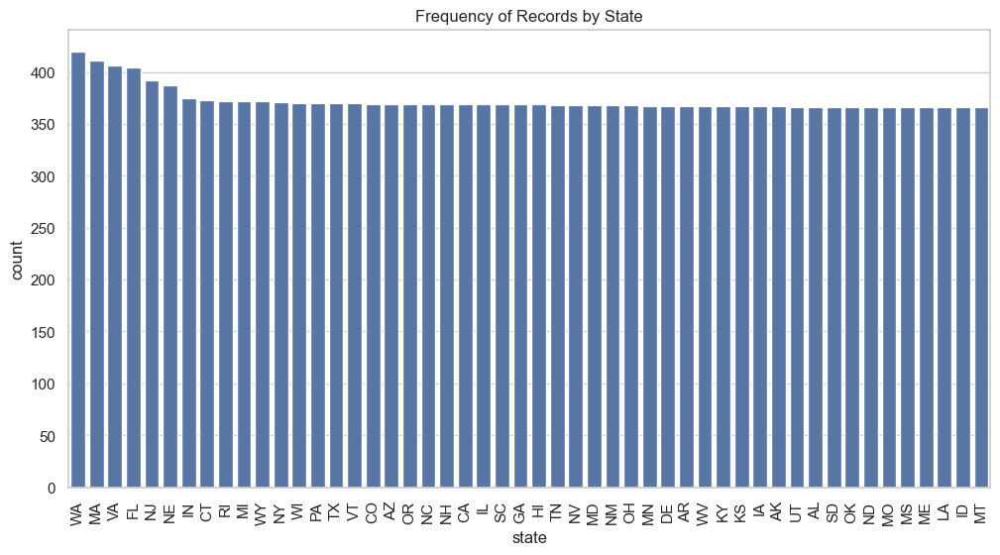

In [29]:

# Example for the 'state' column
plt.figure(figsize=(12, 6))
sns.countplot(data=all_states_data, x='state', order=all_states_data['state'].value_counts().index)
plt.xticks(rotation=90)
plt.title('Frequency of Records by State')
plt.show()


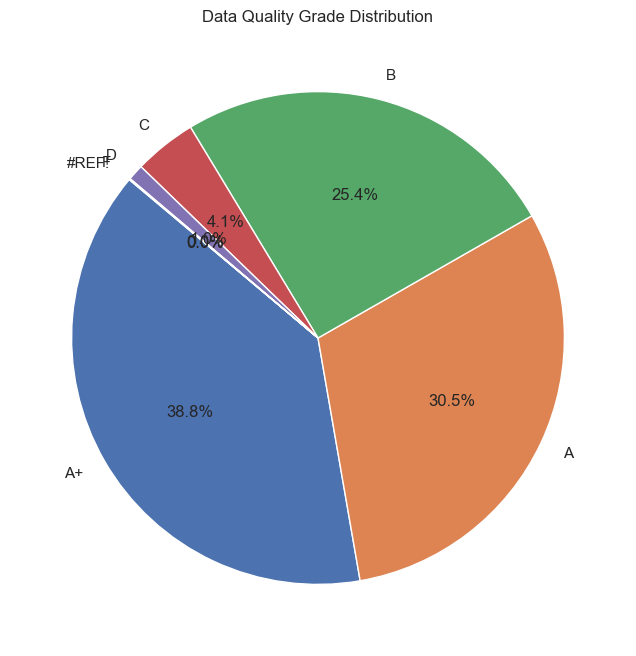

In [30]:
# Pie chart for data quality grade
plt.figure(figsize=(8, 8))
all_states_data['meta.data_quality_grade'].value_counts().plot.pie(autopct='%1.1f%%', startangle=140)
plt.title('Data Quality Grade Distribution')
plt.ylabel('')  # Removes the y-label
plt.show()
